# Movie Posters. Visualizations

In [1]:
import pandas as pd
import urllib.request, json 
import time
import pandas as pd
from PIL import Image
import io
import random
import requests
import numpy as np
from collections import Counter, defaultdict
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import seaborn as sns
from IPython.display import clear_output
import tqdm
import plotly.express as px

## Loading the saved dataset
It was prepared by moviePostersCreateDF.py based on API of https://www.themoviedb.org , an open database of information on movies

In [3]:
df = pd.read_pickle('data/backupMoviesDF.pkl')

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 25 columns):
 #   Column                 Non-Null Count   Dtype  
---  ------                 --------------   -----  
 0   adult                  100000 non-null  bool   
 1   backdrop_path          37171 non-null   object 
 2   belongs_to_collection  3838 non-null    object 
 3   budget                 100000 non-null  int64  
 4   genres                 100000 non-null  object 
 5   homepage               76956 non-null   object 
 6   id                     100000 non-null  int64  
 7   imdb_id                78175 non-null   object 
 8   original_language      100000 non-null  object 
 9   original_title         100000 non-null  object 
 10  overview               100000 non-null  object 
 11  popularity             100000 non-null  float64
 12  poster_path            100000 non-null  object 
 13  production_companies   100000 non-null  object 
 14  production_countries   100000 non-nul

## Functions for visualizations

In [6]:
def getImageFromUrlAsArray(url, draw = True):
    """
    The function returns an image from a give url in an array form for further calculations
    Parameters
    ----------
    url :   string
            Input url, a direct link to an image
            
    draw :  boolean, default = True
            If True the image is showed.

    Returns
    -------
    out :   ndarray
            3 dimensional array with RGB colors
    """
    #time.sleep(1) #activate if a source is sensitive to robots
    response = requests.get(url)
    image = io.BytesIO(response.content)
    image = Image.open(image)
    if draw:
        image.show()
    return np.asarray(image)


def spec(N):
    """
    The function returns an array of N evenly distributed RGB colours.
 
    Parameters
    ----------
    N :   integer
          Number of RGB colours

    Returns
    -------
    out :   ndarray
            2 dimensional array with N RGB colors
            
    Source: 
    https://stackoverflow.com/questions/50980810/how-to-create-a-discrete-rgb-colourmap-with-n-colours-using-numpy
    
    """
    t = np.linspace(-510, 510, N)                                              
    return np.round(np.clip(np.stack([-t, 510-np.abs(t), t], axis=1), 0, 255))


def findClosestColor(col, rgbRange = 32):
    """
    The function returns an image from a give url in an array form for further calculations
    Parameters
    ----------
    col      :  iterable (ndarray, list, tuple)
                Input RGB color, e.g. [244, 123, 33]
            
    rgbRange :  integer, default = 32
                Number of evenly distributed RGB colours to choose from

    Returns
    -------
    out :   ndarray
            1 dimensional array with the closest RGB color chosen from RGB range with rgbRange colors, black and white
    """
    clist = np.append(spec(rgbRange), [[0, 0, 0],[255,255,255]], axis=0)
    res = clist[np.argmin(list(map(lambda x: np.linalg.norm(np.array(col)-x), clist)))]
    return res

def drawSq(col):
    """
    The function plots a square of input RGB color
    """
    width = 1
    height = 1
    fig1 = plt.figure()
    ax1 = fig1.add_subplot(111, aspect='equal')
    ax1.add_patch(
        patches.Rectangle((0, 0), width, height, color=np.array(col)/255))
    plt.show()

def draw2Sq(col1,col2):
    """
    The function plots 2 squares side by side of 2 input RGB colors
    """
    width = 1
    height = 1
    fig1 = plt.figure()
    ax1 = fig1.add_subplot(111, aspect='equal')
    ax1.add_patch(
        patches.Rectangle((0, 0), width, height, color=np.array(col1)/255))
    ax1.add_patch(
        patches.Rectangle((1, 0), width, height, color=np.array(col2)/255))
    plt.xlim([0,2])
    plt.show()

def drawPalette(colList,freqList, barchart = True, log = False):
    """
    The function returns plots a pallette of colors
    
    Parameters
    ----------
    colList  :  list of RGB colors
            
    freqList :  list of corresponding colors ratios
    
    barchart :  boolean, if True a barchart with colors is plotted, otherwise a pallette is plotted

    Returns
    -------
    out :   None
    """
    if barchart:
        plt.bar([str(i) for i in colList], height=freqList, color=colList/255, edgecolor='black')
        plt.xticks(rotation=90)
        if log:
            plt.yscale('log')
        plt.title('Color Frequency Chart')
    else:
        width = 1
        fig1 = plt.figure(dpi=300)
        ax1 = fig1.add_subplot(111, aspect='equal')
        for i,c in enumerate(colList):
            height = freqList[i]
            ax1.add_patch(patches.Rectangle((i, 0), width, height, color=np.array(c)/255))

        plt.xlim([0,len(colList)])
        #plt.title(f'Top {len(colList)} colors (descending)')
        plt.title('Color pallette')
        ax1.axes.get_xaxis().set_visible(False)
        ax1.axes.get_yaxis().set_visible(False)
    plt.show()



In [7]:
def getSmallPosters(url, size = (16,16)):#, folder, name):
    """
    The function returns a shrinked (thumbnail) image from a given url.
    Parameters
    ----------
    urk      :  string
                Image URL
                
    size     :  tuple (integer), default = (16,16)
                Maximum width and height of an output image.

    Returns
    -------
    out :   image
    """
    
    response = requests.get(url)
    image = io.BytesIO(response.content)
    image = Image.open(image)
    image.thumbnail(size)
    return image
    


#### Here I try a bruteforce approach with iterating over pixels

In [171]:
def convertColorsBruteIterating(originalImageArray, rgbRange = 32, draw = True):
    """
    The function returns a tuple with 2 lists. 
    The first one is a list containing RGB colors from RGB range (rgbRange) + black and white.
    The second one is a list containing corresponding ratios of pixels with the closest colors from RGB range (rgbRange) + black and white.
    
    ATTENTION: This function is implementing a bruteforce approach with iterating over pixels, i.e. it takes forever to run.
    Use convertColors function with vectorization instead.
    
    Parameters
    ----------
    originalImageArray  :  ndarray, 
                           3D array representation of an image with RGB colors
            
    rgbRange            :  integer, default = 32
                           Number of evenly distributed RGB colours to choose from
    
    draw                :  bool, default = True
                           If True original and new images will be shown side by side.
                           
                           
    Returns
    -------
    out :   tuple
            (colorList, freqList),
            colorList is a list containing RGB colors from RGB range (rgbRange) + black and white
            freqList is a list containing corresponding ratios of pixels with the colors from RGB range (rgbRange) + black and white.
            
    """
    
    convertedImage = np.zeros(originalImageArray.shape)
    for i,r in enumerate(originalImageArray):
        for j,c in enumerate(r):
            convertedImage[i,j]=np.array(findClosestColor(c))
    if draw:
        Image.fromarray(np.hstack((np.array(originalImageArray),np.array(convertedImage.astype(np.uint8))))).show()
    
    unique, counts = np.unique(convertedImage.reshape(-1,convertedImage.shape[2]), 
                               return_counts=True, axis=0)
    topColors = dict(zip(list(map(tuple, unique)), counts))
    topColors = Counter(topColors)
    
    colorList = np.empty((0,3))
    freqList = np.empty(0)
    for k in topColors.most_common(rgbRange+2):
        colorList = np.append(colorList, np.array(k[0]).reshape(1,3), axis=0)
        freqList = np.append(freqList, k[1])
        
    return colorList, freqList

In [172]:
%%timeit
clrs = convertColorsBruteIterating(getImageFromUrlAsArray('https://image.tmdb.org/t/p/w500'+'/6oom5QYQ2yQTMJIbnvbkBL9cHo6.jpg',
                                    draw = False),
             rgbRange=12)

1min 42s ± 864 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


##### Conclusion: 
beside the fact that my notebook sounded like a jet liner at the take off during the execution, the time spent on it is really discouraging. Therefore I went for the vectorization. 

#### Here I try to achieve the same result by means of vector operations to increase the efficiency

In [175]:
def convertColors(originalImageArray, rgbRange = 32, draw = True, top = True):
    """
    The function returns an image with converted colors. 
    Colors of the new image are the closest ones from RGB range (rgbRange) + black and white
    
    Parameters
    ----------
    originalImageArray  :  ndarray, 
                           3D array representation of an image with RGB colors
            
    rgbRange            :  integer, default = 32
                           Number of evenly distributed RGB colours to choose from
    
    draw                :  bool, default = True
                           If True original and new images will be shown side by side.
                           
    top                 :  bool, default = True
                           If True colorList, freqList will be sorted by freqList values (ascending)
                           
    Returns
    -------
    out :   tuple
            (colorList, freqList),
            colorList is a list containing RGB colors from RGB range (rgbRange) + black and white
            freqList is a list containing corresponding ratios of pixels with the colors from RGB range (rgbRange) + black and white.
            
    """
    
    clist = np.append([[0, 0, 0],[255,255,255]],spec(rgbRange), axis=0) #added black and white in the beginning
    im_data_stretch = originalImageArray.reshape(-1,originalImageArray.shape[2]) #converting to a 2d array with shape (n_pixels, 3)
    clistE = np.broadcast_to(clist, (im_data_stretch.shape[0], rgbRange+2, 3)) #broadcasting clist for operations with im_data_stretch
    im_data_stretch = im_data_stretch.reshape(int(originalImageArray.shape[0]*originalImageArray.shape[1]),1,3)
    #matrix with indices of colors in clist with closest colors
    inpArray = np.array(list(map(np.argmin,(np.sqrt(np.sum((clistE - im_data_stretch) ** 2, axis = 2)))))).reshape(originalImageArray.shape[0:2])
    
    #converting it to RGB matrix for image formation
    mapDct = defaultdict(list)
    for i,c in enumerate(clist):
        mapDct[i]=c
    
    #Source: https://stackoverflow.com/questions/55949809/efficiently-replace-elements-in-array-based-on-dictionary-numpy-python
    k = np.array(list(mapDct.keys()))
    v = np.array(list(mapDct.values()))
    mapping_ar = np.zeros((k.max()+1,3),dtype=v.dtype)
    mapping_ar[k] = v
    convertedImageArray = mapping_ar[inpArray]
    
    if draw:
        convertedImage = Image.fromarray(convertedImageArray.astype(np.uint8), 'RGB')
        Image.fromarray(np.hstack((np.array(originalImageArray),np.array(convertedImage)))).show() #side by side
    
    unique, counts = np.unique(inpArray, return_counts=True)
    topColors = dict(zip(unique, counts))
    topColors = Counter(topColors)
    topColors.most_common(rgbRange+2)
    
    colorList = np.empty((0,3))
    freqList = np.empty(0)
    if top:
        for k in topColors.most_common(rgbRange+2):
            colorList = np.append(colorList, mapDct[k[0]].reshape(1,3), axis=0)
            freqList = np.append(freqList, k[1])
    else:
        for k in mapDct:
            colorList = np.append(colorList, mapDct[k].reshape(1,3), axis=0)
            freqList = np.append(freqList, topColors[k]/int(originalImageArray.shape[0]*originalImageArray.shape[1]))
    return colorList, freqList

In [176]:
%%timeit
clrs = convertColors(getImageFromUrlAsArray('https://image.tmdb.org/t/p/w500'+'/6oom5QYQ2yQTMJIbnvbkBL9cHo6.jpg',
                                    draw = False),
             rgbRange=12, top = False)

998 ms ± 43 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


The obtained result is about 100 times better in terms of efficiency.

In this section I create images of random poster samples of a certain genre for the report.

In [ ]:
def get_concat_h(imlist):
    """
    The function returns an image concatenated horizontally
    
    Parameters
    ----------
    imlist  :  list containing images
    
    Returns
    -------
    out :   image
    """
    im1=imlist[0]
        
    for im in imlist[1:]:
        dst = Image.new('RGB', (im1.width + im.width, im1.height))
        dst.paste(im1, (0, 0))
        dst.paste(im, (im1.width, 0))
        im1 = dst
    #dst.show()
    return dst

In [ ]:
def get_concat_v(imlist):
    """
    The function returns an image concatenated vertically
    
    Parameters
    ----------
    imlist  :  list containing images
    
    Returns
    -------
    out :   image
    """
    im1=imlist[0]
    for im in imlist[1:]: 
        dst = Image.new('RGB', (im1.width, im1.height + im.height))
        dst.paste(im1, (0, 0))
        dst.paste(im, (0, im1.height))
        im1 = dst
    #dst.show()
    return dst

In [165]:
gdf = df2[df2['mainGenre']=='Science Fiction']['poster_path']
gdf = list(gdf)
random.shuffle(gdf)

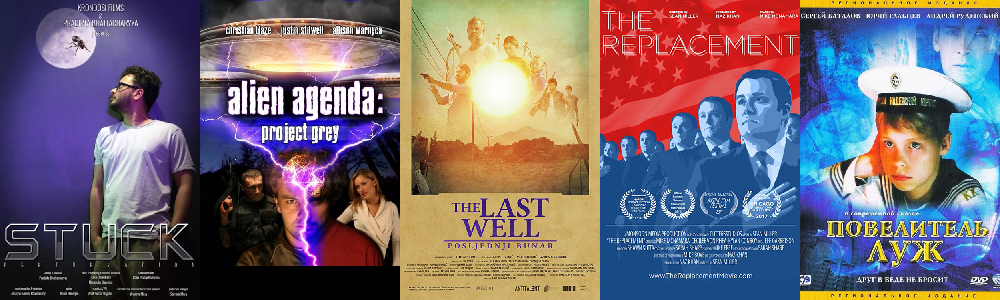

In [166]:
ims = []
n = 5
i = 0
for u in gdf:
    #u = "/qdxLPDUSvQUH6yHHxlfVOQpGrA1.jpg"
    try:
        time.sleep(0.1)
        response = requests.get('https://image.tmdb.org/t/p/w500'+str(u))
        image = io.BytesIO(response.content)
        image = Image.open(image)
        ims.append(image)
        i+=1
        if i==n:
            break
    except:
        pass
get_concat_h(ims)

## Getting color distributions 
I decided not to save all posters in the dataframe as it'd obviosly be an enormous dataset hard to work with. Therefore I just add color distributions by applying convertColors function.
The distributions will be in form of list containing color ratios for each existing movie poster.
This information will be added as a column name colorFreq.  
The considered colors (pallette) are  black, white and 16 colors evenly distributed on RGB range.  
The pallette will be added as a 2D list of RGB colours and is same for all rows.

In [6]:
clrsList = []
rgbRange = 16
for i,posterUrl in enumerate(tqdm.tqdm(df['poster_path'])): #tqdm enables progress bar
    #clear_output(wait=True)
    #print(f"Current url: {posterUrl}. {i+1} from {len(df['poster_path'])}")
    try:
        if i%200 == 0 | i==0:
            clrs = convertColors(getImageFromUrlAsArray('https://image.tmdb.org/t/p/w500'+posterUrl,
                                            draw = False),
                     rgbRange=rgbRange, top=False, draw = True)
        else:
            clrs = convertColors(getImageFromUrlAsArray('https://image.tmdb.org/t/p/w500'+posterUrl,
                                            draw = False),
                     rgbRange=rgbRange, top=False, draw = False)
        #print('Succesful')
    except:
        clrs = np.nan
        #print('Passed')
    clrsList.append(clrs)

100%|██████████| 100000/100000 [26:23:50<00:00,  1.05it/s]    


In [9]:
#Checking if everything's OK
clrsList[2]

(array([[  0.,   0.,   0.],
        [255., 255., 255.],
        [255.,   0.,   0.],
        [255.,  68.,   0.],
        [255., 136.,   0.],
        [255., 204.,   0.],
        [238., 255.,   0.],
        [170., 255.,   0.],
        [102., 255.,   0.],
        [ 34., 255.,   0.],
        [  0., 255.,  34.],
        [  0., 255., 102.],
        [  0., 255., 170.],
        [  0., 255., 238.],
        [  0., 204., 255.],
        [  0., 136., 255.],
        [  0.,  68., 255.],
        [  0.,   0., 255.]]),
 array([0.10940267, 0.44272533, 0.        , 0.        , 0.        ,
        0.        , 0.        , 0.00730933, 0.005096  , 0.        ,
        0.        , 0.11938667, 0.312904  , 0.        , 0.        ,
        0.003176  , 0.        , 0.        ]))

In [10]:
df['colorData'] = clrsList

In [11]:
df['colorData'],df['colorFreq'] = df['colorData'].apply(pd.Series)[0],df['colorData'].apply(pd.Series)[1]
df

,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,...,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,colorData,colorFreq
0,False,None,None,0,"[{'id': 99, 'name': 'Documentary'}]",http://watershieldfilm.com,603144,tt10199248,en,Warburdar Bununu: Water Shield,...,63.0,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,,Warburdar Bununu: Water Shield,False,0.0,0,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.30337333333333333, 0.461288, 0.0, 0.019152,..."
1,False,/fOIWdJZ0hrmEp0U2HlIOrnJ1cPn.jpg,"{'id': 558854, 'name': 'Howard Lovecraft Colle...",0,"[{'id': 16, 'name': 'Animation'}, {'id': 12, '...",,566611,tt9055114,en,Howard Lovecraft and the Kingdom of Madness,...,75.0,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,,Howard Lovecraft and the Kingdom of Madness,False,9.0,1,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.355352, 0.121864, 0.044338666666666665, 0.1..."
2,False,None,None,0,[],,681538,None,es,Strom,...,3.0,[],Released,,Strom,False,0.0,0,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.10940266666666666, 0.44272533333333336, 0.0..."
3,False,/k92xXjOcVJxPpIDPKXRFsy8D6gn.jpg,None,0,"[{'id': 10749, 'name': 'Romance'}, {'id': 1077...",,642333,tt11241514,en,A Cheerful Christmas,...,90.0,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,,A Cheerful Christmas,False,5.7,10,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.35431466666666667, 0.194392, 0.010872, 0.08..."
4,False,/judbLxIysVRaljL7fIs8jrBLcpw.jpg,None,0,"[{'id': 18, 'name': 'Drama'}]",,197237,tt0105614,it,Tolgo il disturbo,...,0.0,"[{'english_name': 'Italian', 'iso_639_1': 'it'...",Released,,I'll Be Going Now,False,6.2,9,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.366568, 0.20889866666666668, 0.275784, 0.02..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,False,None,None,0,[],None,546654,None,pt,Berenice,...,NaN,[],Released,,Berenice,False,0.0,0,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.6589945652173913, 0.09105163043478261, 0.01..."
99996,False,None,None,0,"[{'id': 16, 'name': 'Animation'}]",None,429358,tt4852398,en,Malchik s palchik,...,11.0,"[{'english_name': 'Russian', 'iso_639_1': 'ru'...",Released,,Tom Thumb,False,0.0,0,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.6584744525547446, 0.29682238442822384, 0.0,..."
99997,False,/p9rEBcux6tFbIbJGmnNHTtVLISw.jpg,None,0,"[{'id': 10402, 'name': 'Music'}, {'id': 10752,...",,702314,None,en,Miss Saigon Manila,...,145.0,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,A forbidden love. A god-forsaken war. The heat...,Miss Saigon Manila,False,10.0,1,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.5330453333333334, 0.0028293333333333334, 0...."
99998,False,None,None,0,"[{'id': 99, 'name': 'Documentary'}]",,306456,,fr,Eaten Alive,...,0.0,[],Released,,Eaten Alive,False,2.0,1,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.779248, 0.07127733333333333, 0.0, 0.0357333..."


Saving the datframe with added info on color distributions as a separate pickle file.

In [12]:
df.to_pickle('dfMoviesAndColors.pkl')

In [5]:
df=pd.read_pickle('dfMoviesAndColors.pkl')

Eliminating records with NaN color distributions.  
The precise reason for NaN values is unknown by now as the records without posters were dropped before calcualting the distributions. Probably there was an error during loading the images from the links.

In [6]:
df=df[df['colorFreq'].notnull()]

In [7]:
df.head()

,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,...,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,colorData,colorFreq
0,False,None,None,0,"[{'id': 99, 'name': 'Documentary'}]",http://watershieldfilm.com,603144,tt10199248,en,Warburdar Bununu: Water Shield,...,63.0,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,,Warburdar Bununu: Water Shield,False,0.0,0,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.30337333333333333, 0.461288, 0.0, 0.019152,..."
1,False,/fOIWdJZ0hrmEp0U2HlIOrnJ1cPn.jpg,"{'id': 558854, 'name': 'Howard Lovecraft Colle...",0,"[{'id': 16, 'name': 'Animation'}, {'id': 12, '...",,566611,tt9055114,en,Howard Lovecraft and the Kingdom of Madness,...,75.0,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,,Howard Lovecraft and the Kingdom of Madness,False,9.0,1,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.355352, 0.121864, 0.044338666666666665, 0.1..."
2,False,None,None,0,[],,681538,None,es,Strom,...,3.0,[],Released,,Strom,False,0.0,0,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.10940266666666666, 0.44272533333333336, 0.0..."
3,False,/k92xXjOcVJxPpIDPKXRFsy8D6gn.jpg,None,0,"[{'id': 10749, 'name': 'Romance'}, {'id': 1077...",,642333,tt11241514,en,A Cheerful Christmas,...,90.0,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,,A Cheerful Christmas,False,5.7,10,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.35431466666666667, 0.194392, 0.010872, 0.08..."
4,False,/judbLxIysVRaljL7fIs8jrBLcpw.jpg,None,0,"[{'id': 18, 'name': 'Drama'}]",,197237,tt0105614,it,Tolgo il disturbo,...,0.0,"[{'english_name': 'Italian', 'iso_639_1': 'it'...",Released,,I'll Be Going Now,False,6.2,9,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.366568, 0.20889866666666668, 0.275784, 0.02..."


In [8]:
df = df.reset_index()
df = df.drop(columns='index')
df

,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,...,runtime,spoken_languages,status,tagline,title,video,vote_average,vote_count,colorData,colorFreq
0,False,None,None,0,"[{'id': 99, 'name': 'Documentary'}]",http://watershieldfilm.com,603144,tt10199248,en,Warburdar Bununu: Water Shield,...,63.0,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,,Warburdar Bununu: Water Shield,False,0.0,0,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.30337333333333333, 0.461288, 0.0, 0.019152,..."
1,False,/fOIWdJZ0hrmEp0U2HlIOrnJ1cPn.jpg,"{'id': 558854, 'name': 'Howard Lovecraft Colle...",0,"[{'id': 16, 'name': 'Animation'}, {'id': 12, '...",,566611,tt9055114,en,Howard Lovecraft and the Kingdom of Madness,...,75.0,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,,Howard Lovecraft and the Kingdom of Madness,False,9.0,1,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.355352, 0.121864, 0.044338666666666665, 0.1..."
2,False,None,None,0,[],,681538,None,es,Strom,...,3.0,[],Released,,Strom,False,0.0,0,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.10940266666666666, 0.44272533333333336, 0.0..."
3,False,/k92xXjOcVJxPpIDPKXRFsy8D6gn.jpg,None,0,"[{'id': 10749, 'name': 'Romance'}, {'id': 1077...",,642333,tt11241514,en,A Cheerful Christmas,...,90.0,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,,A Cheerful Christmas,False,5.7,10,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.35431466666666667, 0.194392, 0.010872, 0.08..."
4,False,/judbLxIysVRaljL7fIs8jrBLcpw.jpg,None,0,"[{'id': 18, 'name': 'Drama'}]",,197237,tt0105614,it,Tolgo il disturbo,...,0.0,"[{'english_name': 'Italian', 'iso_639_1': 'it'...",Released,,I'll Be Going Now,False,6.2,9,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.366568, 0.20889866666666668, 0.275784, 0.02..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97515,False,None,None,0,[],None,546654,None,pt,Berenice,...,NaN,[],Released,,Berenice,False,0.0,0,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.6589945652173913, 0.09105163043478261, 0.01..."
97516,False,None,None,0,"[{'id': 16, 'name': 'Animation'}]",None,429358,tt4852398,en,Malchik s palchik,...,11.0,"[{'english_name': 'Russian', 'iso_639_1': 'ru'...",Released,,Tom Thumb,False,0.0,0,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.6584744525547446, 0.29682238442822384, 0.0,..."
97517,False,/p9rEBcux6tFbIbJGmnNHTtVLISw.jpg,None,0,"[{'id': 10402, 'name': 'Music'}, {'id': 10752,...",,702314,None,en,Miss Saigon Manila,...,145.0,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,A forbidden love. A god-forsaken war. The heat...,Miss Saigon Manila,False,10.0,1,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.5330453333333334, 0.0028293333333333334, 0...."
97518,False,None,None,0,"[{'id': 99, 'name': 'Documentary'}]",,306456,,fr,Eaten Alive,...,0.0,[],Released,,Eaten Alive,False,2.0,1,"[[0.0, 0.0, 0.0], [255.0, 255.0, 255.0], [255....","[0.779248, 0.07127733333333333, 0.0, 0.0357333..."


### Colours to columns
This is done for further grouping with calculating mean colors in a group.   
First I create a separate dataframe **dfColours** with color distributions.  
Then I concatenate it with the original one (**df**) forming a new dataframe called **df2**.

In [9]:
dfColours = pd.DataFrame(df["colorFreq"].tolist())
dfColours.columns = list(map(lambda x: str(x), df['colorData'][0]))
dfColours.head()

,[0. 0. 0.],[255. 255. 255.],[255. 0. 0.],[255. 68. 0.],[255. 136. 0.],[255. 204. 0.],[238. 255. 0.],[170. 255. 0.],[102. 255. 0.],[ 34. 255. 0.],[ 0. 255. 34.],[ 0. 255. 102.],[ 0. 255. 170.],[ 0. 255. 238.],[ 0. 204. 255.],[ 0. 136. 255.],[ 0. 68. 255.],[ 0. 0. 255.]
0,0.303373,0.461288,0.000000,0.019152,0.088555,0.000216,0.000000,0.015707,0.042413,0.0,0.0,0.035627,0.009237,0.0,0.000000,0.024432,0.000000,0.000000
1,0.355352,0.121864,0.044339,0.182051,0.163640,0.088627,0.003965,0.000147,0.000477,0.0,0.0,0.000483,0.000256,0.0,0.000752,0.011149,0.026821,0.000077
2,0.109403,0.442725,0.000000,0.000000,0.000000,0.000000,0.000000,0.007309,0.005096,0.0,0.0,0.119387,0.312904,0.0,0.000000,0.003176,0.000000,0.000000
3,0.354315,0.194392,0.010872,0.085883,0.310541,0.039576,0.000152,0.001125,0.001045,0.0,0.0,0.000667,0.000437,0.0,0.000019,0.000976,0.000000,0.000000
4,0.366568,0.208899,0.275784,0.023464,0.042672,0.002061,0.000000,0.000299,0.001040,0.0,0.0,0.004232,0.001507,0.0,0.001195,0.067613,0.004667,0.000000


In [10]:
dfColours.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 97520 entries, 0 to 97519
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   [0. 0. 0.]        97520 non-null  float64
 1   [255. 255. 255.]  97520 non-null  float64
 2   [255.   0.   0.]  97520 non-null  float64
 3   [255.  68.   0.]  97520 non-null  float64
 4   [255. 136.   0.]  97520 non-null  float64
 5   [255. 204.   0.]  97520 non-null  float64
 6   [238. 255.   0.]  97520 non-null  float64
 7   [170. 255.   0.]  97520 non-null  float64
 8   [102. 255.   0.]  97520 non-null  float64
 9   [ 34. 255.   0.]  97520 non-null  float64
 10  [  0. 255.  34.]  97520 non-null  float64
 11  [  0. 255. 102.]  97520 non-null  float64
 12  [  0. 255. 170.]  97520 non-null  float64
 13  [  0. 255. 238.]  97520 non-null  float64
 14  [  0. 204. 255.]  97520 non-null  float64
 15  [  0. 136. 255.]  97520 non-null  float64
 16  [  0.  68. 255.]  97520 non-null  float6

In [11]:
if len(df)==len(dfColours):
    print("All seems good. Let's join them ")

All seems good. Let's join them 


In [12]:
df2 = pd.concat([df,dfColours], axis=1)
df2

,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,...,[102. 255. 0.],[ 34. 255. 0.],[ 0. 255. 34.],[ 0. 255. 102.],[ 0. 255. 170.],[ 0. 255. 238.],[ 0. 204. 255.],[ 0. 136. 255.],[ 0. 68. 255.],[ 0. 0. 255.]
0,False,None,None,0,"[{'id': 99, 'name': 'Documentary'}]",http://watershieldfilm.com,603144,tt10199248,en,Warburdar Bununu: Water Shield,...,0.042413,0.0,0.0,0.035627,0.009237,0.0,0.000000,0.024432,0.000000,0.000000
1,False,/fOIWdJZ0hrmEp0U2HlIOrnJ1cPn.jpg,"{'id': 558854, 'name': 'Howard Lovecraft Colle...",0,"[{'id': 16, 'name': 'Animation'}, {'id': 12, '...",,566611,tt9055114,en,Howard Lovecraft and the Kingdom of Madness,...,0.000477,0.0,0.0,0.000483,0.000256,0.0,0.000752,0.011149,0.026821,0.000077
2,False,None,None,0,[],,681538,None,es,Strom,...,0.005096,0.0,0.0,0.119387,0.312904,0.0,0.000000,0.003176,0.000000,0.000000
3,False,/k92xXjOcVJxPpIDPKXRFsy8D6gn.jpg,None,0,"[{'id': 10749, 'name': 'Romance'}, {'id': 1077...",,642333,tt11241514,en,A Cheerful Christmas,...,0.001045,0.0,0.0,0.000667,0.000437,0.0,0.000019,0.000976,0.000000,0.000000
4,False,/judbLxIysVRaljL7fIs8jrBLcpw.jpg,None,0,"[{'id': 18, 'name': 'Drama'}]",,197237,tt0105614,it,Tolgo il disturbo,...,0.001040,0.0,0.0,0.004232,0.001507,0.0,0.001195,0.067613,0.004667,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
97515,False,None,None,0,[],None,546654,None,pt,Berenice,...,0.001255,0.0,0.0,0.000073,0.000003,0.0,0.000000,0.000120,0.000000,0.000000
97516,False,None,None,0,"[{'id': 16, 'name': 'Animation'}]",None,429358,tt4852398,en,Malchik s palchik,...,0.018526,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
97517,False,/p9rEBcux6tFbIbJGmnNHTtVLISw.jpg,None,0,"[{'id': 10402, 'name': 'Music'}, {'id': 10752,...",,702314,None,en,Miss Saigon Manila,...,0.000059,0.0,0.0,0.000003,0.000000,0.0,0.000000,0.000059,0.000000,0.000000
97518,False,None,None,0,"[{'id': 99, 'name': 'Documentary'}]",,306456,,fr,Eaten Alive,...,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000


## Prepartion for visualization
We will need to create an RGB pallette in a righ format for using it when visualizing with Plotly Express (for passing it to **color_discrete_sequence** argument).

In [18]:
rgbList = []
for c in df['colorData'][0]:
    rgbList.append(f"rgb({int(c[0])},{int(c[1])},{int(c[2])})")
rgbList

['rgb(0,0,0)',
 'rgb(255,255,255)',
 'rgb(255,0,0)',
 'rgb(255,68,0)',
 'rgb(255,136,0)',
 'rgb(255,204,0)',
 'rgb(238,255,0)',
 'rgb(170,255,0)',
 'rgb(102,255,0)',
 'rgb(34,255,0)',
 'rgb(0,255,34)',
 'rgb(0,255,102)',
 'rgb(0,255,170)',
 'rgb(0,255,238)',
 'rgb(0,204,255)',
 'rgb(0,136,255)',
 'rgb(0,68,255)',
 'rgb(0,0,255)']

Here's our pallette.

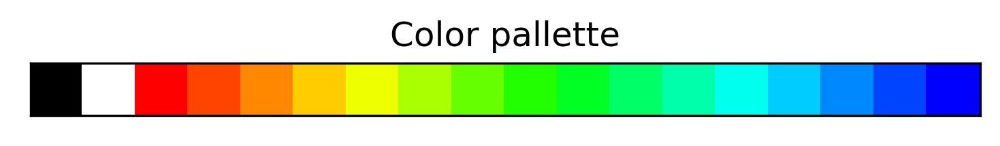

In [19]:
drawPalette(df['colorData'][0],[1 for i in range(len(df['colorData'][0]))], barchart=False)

## Genres and colours

Let's start with analyzing the colors distributions by genres. To do that I define the first (and therfore main) genre of the movie.  
I'll need to map a special function as genres are saved in form of dictionaries in **genres** column.

In [20]:
def getGenre(x):
    """
    The function returns the first genre from the genre dictionary in genres column
    """
    try:
        genre = x[0]['name']
        return genre
    except:
        return np.nan

In [21]:
dfGenre = df2
dfGenre['mainGenre']=dfGenre['genres'].apply(getGenre)
dfGenre.head()

,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,...,[ 34. 255. 0.],[ 0. 255. 34.],[ 0. 255. 102.],[ 0. 255. 170.],[ 0. 255. 238.],[ 0. 204. 255.],[ 0. 136. 255.],[ 0. 68. 255.],[ 0. 0. 255.],mainGenre
0,False,None,None,0,"[{'id': 99, 'name': 'Documentary'}]",http://watershieldfilm.com,603144,tt10199248,en,Warburdar Bununu: Water Shield,...,0.0,0.0,0.035627,0.009237,0.0,0.000000,0.024432,0.000000,0.000000,Documentary
1,False,/fOIWdJZ0hrmEp0U2HlIOrnJ1cPn.jpg,"{'id': 558854, 'name': 'Howard Lovecraft Colle...",0,"[{'id': 16, 'name': 'Animation'}, {'id': 12, '...",,566611,tt9055114,en,Howard Lovecraft and the Kingdom of Madness,...,0.0,0.0,0.000483,0.000256,0.0,0.000752,0.011149,0.026821,0.000077,Animation
2,False,None,None,0,[],,681538,None,es,Strom,...,0.0,0.0,0.119387,0.312904,0.0,0.000000,0.003176,0.000000,0.000000,NaN
3,False,/k92xXjOcVJxPpIDPKXRFsy8D6gn.jpg,None,0,"[{'id': 10749, 'name': 'Romance'}, {'id': 1077...",,642333,tt11241514,en,A Cheerful Christmas,...,0.0,0.0,0.000667,0.000437,0.0,0.000019,0.000976,0.000000,0.000000,Romance
4,False,/judbLxIysVRaljL7fIs8jrBLcpw.jpg,None,0,"[{'id': 18, 'name': 'Drama'}]",,197237,tt0105614,it,Tolgo il disturbo,...,0.0,0.0,0.004232,0.001507,0.0,0.001195,0.067613,0.004667,0.000000,Drama


Now let's group the dataframe by genre and calculate the mean value of color ratios within each genre

In [22]:
dfGenre = dfGenre.groupby(by='mainGenre').mean()

In [23]:
px.bar(dfGenre.iloc[:,9:].sort_values(by='[0. 0. 0.]'), color_discrete_sequence = rgbList)

In [62]:
px.bar(dfGenre.iloc[:,9:].sort_values(by='[0. 0. 0.]'), color_discrete_sequence = rgbList).write_html('movies_genres.html')

## Years and colors
Now let's do the same for years.

In [24]:
dfYears = df2
dfYears['release_date']=pd.to_datetime(dfYears['release_date'])
dfYears['year']=dfYears['release_date'].apply(lambda x: x.year)
dfYears = dfYears.groupby(by='year').mean()

In [25]:
dfYears

,adult,budget,id,popularity,revenue,runtime,video,vote_average,vote_count,[0. 0. 0.],...,[102. 255. 0.],[ 34. 255. 0.],[ 0. 255. 34.],[ 0. 255. 102.],[ 0. 255. 170.],[ 0. 255. 238.],[ 0. 204. 255.],[ 0. 136. 255.],[ 0. 68. 255.],[ 0. 0. 255.]
year,,,,,,,,,,,,,,,,,,,,,
1878.0,0.000000,1.530000e+02,751212.000000,0.640000,0.000000e+00,1.000000,0.000000,5.400000,4.000000,0.256499,...,0.000176,0.000000e+00,0.000000e+00,0.000019,0.000016,0.000000,0.000000,0.005299,0.002760,0.000000
1879.0,0.000000,0.000000e+00,766094.000000,0.681000,0.000000e+00,1.000000,0.000000,5.000000,3.000000,0.628413,...,0.013784,0.000000e+00,0.000000e+00,0.003680,0.000000,0.000000,0.000000,0.005312,0.003653,0.000000
1881.0,0.000000,0.000000e+00,502575.000000,1.691000,0.000000e+00,1.000000,0.000000,5.300000,16.000000,0.145787,...,0.020514,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1887.0,0.000000,0.000000e+00,539836.666667,1.669667,0.000000e+00,1.000000,0.000000,4.700000,17.333333,0.572726,...,0.014000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1888.0,0.000000,0.000000e+00,16463.500000,4.243500,0.000000e+00,1.000000,0.000000,6.200000,93.500000,0.770345,...,0.023973,0.000000e+00,0.000000e+00,0.001383,0.000076,0.000000,0.000000,0.029800,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018.0,0.000183,5.692568e+05,570271.418758,2.728359,2.019041e+06,58.053787,0.041216,2.820059,44.245466,0.472031,...,0.008815,3.834342e-04,4.771805e-04,0.006308,0.005071,0.000385,0.008890,0.048867,0.017181,0.002133
2019.0,0.000172,4.206323e+05,636556.944100,3.310867,1.458671e+06,56.822838,0.043688,2.637702,27.537152,0.468388,...,0.008575,2.826878e-04,4.675173e-04,0.006385,0.004579,0.000613,0.008271,0.046286,0.017539,0.001927
2020.0,0.000219,3.255749e+05,708356.654251,5.263808,3.910701e+05,47.987949,0.028703,2.281858,17.657099,0.477151,...,0.008839,3.163521e-04,2.876751e-04,0.006367,0.005192,0.000638,0.008066,0.045623,0.018992,0.002238


In [44]:
px.bar(dfYears.iloc[:,9:], color_discrete_sequence = rgbList)

In [43]:
px.bar(dfYears.iloc[:,9:], color_discrete_sequence = rgbList).write_html('movies_years.html')

In [54]:
len(df2)

97520

## Countries and colours

In [27]:
def getCountry(x):
    try:
        country = x[0]['name']
        return country
    except:
        return np.nan

In [47]:
dfCountry = df2
dfCountry['country'] = dfCountry.production_countries.apply(getCountry)
dfCountry = dfCountry.groupby(by='country').mean()
dfCountry.drop(columns=['year'], inplace = True)

In [48]:
listOfCountries = ['China', 
                   'Japan',
                   'Germany', 
                   'South Korea',
                   'Canada',
                   'India',
                   'Russia',
                   'Italy',
                   'United States of America',
                   'United Kingdom',
                   'France', 
                   'Spain']

In [53]:
px.bar(dfCountry[dfCountry.index.isin(listOfCountries)].iloc[:,9:].sort_values(by='[0. 0. 0.]'), 
       color_discrete_sequence = rgbList, height = 600,).write_html('movies_countries.html')

In [52]:
px.bar(dfCountry[dfCountry.index.isin(listOfCountries)].iloc[:,9:].sort_values(by='[0. 0. 0.]'), 
       color_discrete_sequence = rgbList, height = 600,)

Now let's create a folium map with colors

In [31]:
dfCountry2 = dfCountry.iloc[:,11:]
dfCountry2['topColor'] = dfCountry2.idxmax(axis=1)
dfCountry2.reset_index(inplace= True)
dfCountry2 = dfCountry2[['country', 'topColor']]
dfCountry2['topColor'] = dfCountry2['topColor'].apply(lambda x: f"rgb({x[1:-2].replace('.',',')})")
dfCountry2
#dfCountry2['topColorRgb'] = dfCountry2['topColor'].apply()

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,country,topColor
0,Afghanistan,"rgb(255, 136, 0)"
1,Albania,"rgb(255, 136, 0)"
2,Algeria,"rgb(255, 136, 0)"
3,Andorra,"rgb(255, 68, 0)"
4,Angola,"rgb(255, 136, 0)"
...,...,...
192,Vietnam,"rgb(255, 136, 0)"
193,Wallis and Futuna Islands,"rgb( 0, 136, 255)"
194,Yugoslavia,"rgb(255, 68, 0)"
195,Zambia,"rgb(255, 136, 0)"


In [33]:
px.bar(dfCountry2['topColor'])

In [34]:
rgbListWithoutBW = rgbList[2:]
def getTopColor(x):
    return rgbListWithoutBW[np.argmax(x[2:])]

In [37]:
df3 = df2
df3['topColor']=df3['colorFreq'].apply(getTopColor)
df3.head()

,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,...,[ 0. 255. 170.],[ 0. 255. 238.],[ 0. 204. 255.],[ 0. 136. 255.],[ 0. 68. 255.],[ 0. 0. 255.],mainGenre,year,country,topColor
0,False,None,None,0,"[{'id': 99, 'name': 'Documentary'}]",http://watershieldfilm.com,603144,tt10199248,en,Warburdar Bununu: Water Shield,...,0.009237,0.0,0.000000,0.024432,0.000000,0.000000,Documentary,2019.0,NaN,"rgb(255,136,0)"
1,False,/fOIWdJZ0hrmEp0U2HlIOrnJ1cPn.jpg,"{'id': 558854, 'name': 'Howard Lovecraft Colle...",0,"[{'id': 16, 'name': 'Animation'}, {'id': 12, '...",,566611,tt9055114,en,Howard Lovecraft and the Kingdom of Madness,...,0.000256,0.0,0.000752,0.011149,0.026821,0.000077,Animation,2021.0,Canada,"rgb(255,68,0)"
2,False,None,None,0,[],,681538,None,es,Strom,...,0.312904,0.0,0.000000,0.003176,0.000000,0.000000,NaN,2010.0,NaN,"rgb(0,255,170)"
3,False,/k92xXjOcVJxPpIDPKXRFsy8D6gn.jpg,None,0,"[{'id': 10749, 'name': 'Romance'}, {'id': 1077...",,642333,tt11241514,en,A Cheerful Christmas,...,0.000437,0.0,0.000019,0.000976,0.000000,0.000000,Romance,2019.0,Canada,"rgb(255,136,0)"
4,False,/judbLxIysVRaljL7fIs8jrBLcpw.jpg,None,0,"[{'id': 18, 'name': 'Drama'}]",,197237,tt0105614,it,Tolgo il disturbo,...,0.001507,0.0,0.001195,0.067613,0.004667,0.000000,Drama,1990.0,NaN,"rgb(255,0,0)"


In [38]:
dfCountry = df2
dfCountry['country'] = dfCountry.production_countries.apply(getCountry)
dfCountry = dfCountry.groupby(by='country').mean()
dfCountry.head()

,adult,budget,id,popularity,revenue,runtime,video,vote_average,vote_count,[0. 0. 0.],...,[ 34. 255. 0.],[ 0. 255. 34.],[ 0. 255. 102.],[ 0. 255. 170.],[ 0. 255. 238.],[ 0. 204. 255.],[ 0. 136. 255.],[ 0. 68. 255.],[ 0. 0. 255.],year
country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0.0,1.055053e+06,497447.263158,2.040579,3.856634e+06,62.833333,0.0,3.373684,53.052632,0.404379,...,0.000022,0.000032,0.001720,0.002038,0.000000,0.006131,0.072315,0.032858,2.461754e-04,2012.315789
Albania,0.0,3.495978e+03,482164.344086,0.852280,0.000000e+00,71.684783,0.0,1.767742,2.000000,0.524615,...,0.000039,0.000070,0.020499,0.007276,0.000176,0.004976,0.062282,0.018744,3.872879e-03,1988.956989
Algeria,0.0,3.030303e-02,444910.060606,1.553636,2.524394e+03,77.212121,0.0,2.975758,11.212121,0.381900,...,0.000289,0.000003,0.003278,0.001387,0.000000,0.002700,0.015905,0.004944,4.042597e-03,2002.818182
Andorra,0.0,0.000000e+00,774096.000000,0.600000,0.000000e+00,0.000000,0.0,0.000000,0.000000,0.058709,...,0.000000,0.000000,0.000029,0.000005,0.000000,0.000000,0.000136,0.000000,0.000000e+00,2020.000000
Angola,0.0,0.000000e+00,418076.571429,1.204286,0.000000e+00,72.000000,0.0,3.371429,9.142857,0.362780,...,0.000000,0.000000,0.007302,0.002979,0.000000,0.000859,0.017419,0.004270,3.809524e-07,1997.285714


In [36]:
rgbListWithoutBW

['rgb(255,0,0)',
 'rgb(255,68,0)',
 'rgb(255,136,0)',
 'rgb(255,204,0)',
 'rgb(238,255,0)',
 'rgb(170,255,0)',
 'rgb(102,255,0)',
 'rgb(34,255,0)',
 'rgb(0,255,34)',
 'rgb(0,255,102)',
 'rgb(0,255,170)',
 'rgb(0,255,238)',
 'rgb(0,204,255)',
 'rgb(0,136,255)',
 'rgb(0,68,255)',
 'rgb(0,0,255)']

In [92]:
df2.groupby(by='year').count()

,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,...,[ 34. 255. 0.],[ 0. 255. 34.],[ 0. 255. 102.],[ 0. 255. 170.],[ 0. 255. 238.],[ 0. 204. 255.],[ 0. 136. 255.],[ 0. 68. 255.],[ 0. 0. 255.],mainGenre
year,,,,,,,,,,,,,,,,,,,,,
1893.0,1,0,0,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
1895.0,1,1,0,1,1,1,1,1,1,1,...,1,1,1,1,1,1,1,1,1,1
1896.0,3,0,0,3,3,1,3,3,3,3,...,3,3,3,3,3,3,3,3,3,2
1897.0,4,0,0,4,4,3,4,4,4,4,...,4,4,4,4,4,4,4,4,4,0
1898.0,4,1,0,4,4,3,4,4,4,4,...,4,4,4,4,4,4,4,4,4,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2018.0,1139,535,31,1139,1139,741,1139,765,1139,1139,...,1139,1139,1139,1139,1139,1139,1139,1139,1139,893
2019.0,1210,603,19,1210,1210,996,1210,786,1210,1210,...,1210,1210,1210,1210,1210,1210,1210,1210,1210,933
2020.0,1001,461,12,1001,1001,1001,1001,538,1001,1001,...,1001,1001,1001,1001,1001,1001,1001,1001,1001,774


In [95]:
df2[df2['year']==1893].poster_path

19695    /sQHhjP7khHjrifGqVivO35R5k7K.jpg
Name: poster_path, dtype: object

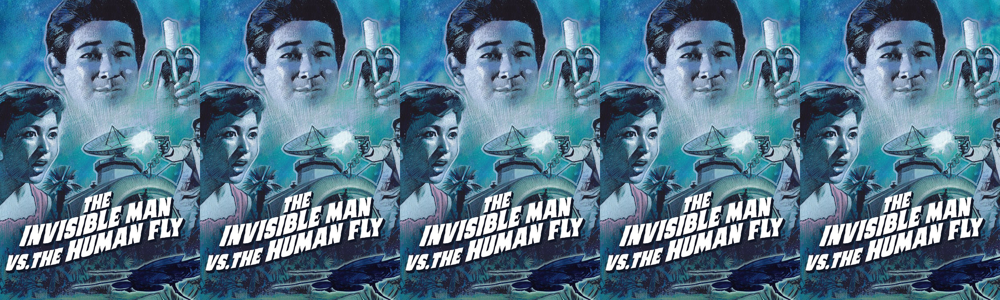

In [87]:
get_concat_h(ims)

In [ ]:
def reshapeList(lst,r,c):
    newlst = []
    for i in range(r):
        newlst.append(lst[i*c:(i+1)*c+1])
    return newlst        

In [ ]:
imMatr = []
for u in tqdm.tqdm(np.array(df4000['poster_path'])):
    imMatr.append(getSmallPosters(u))

In [ ]:
imMatr = reshapeList(imMatr,20,200)

In [ ]:
v = []
for u in tqdm.tqdm(imMatr):
    v.append(get_concat_h(u))
get_concat_v(v)

In [170]:
h = px.histogram(df2.year)
h

In [42]:
h.write_html('movies_hist.html')

In [56]:
path = 'https://datahub.io/core/geo-countries/r/countries.geojson'

In [57]:
dfCountry2

,country,topColor
0,Afghanistan,"rgb(255, 136, 0)"
1,Albania,"rgb(255, 136, 0)"
2,Algeria,"rgb(255, 136, 0)"
3,Andorra,"rgb(255, 68, 0)"
4,Angola,"rgb(255, 136, 0)"
...,...,...
192,Vietnam,"rgb(255, 136, 0)"
193,Wallis and Futuna Islands,"rgb( 0, 136, 255)"
194,Yugoslavia,"rgb(255, 68, 0)"
195,Zambia,"rgb(255, 136, 0)"


In [58]:
import geopandas as gpd
dfgpd = gpd.read_file(path)

In [59]:
dfgpd.head()

,ADMIN,ISO_A3,geometry
0,Aruba,ABW,"POLYGON ((-69.99694 12.57758, -69.93639 12.531..."
1,Afghanistan,AFG,"POLYGON ((71.04980 38.40866, 71.05714 38.40903..."
2,Angola,AGO,"MULTIPOLYGON (((11.73752 -16.69258, 11.73851 -..."
3,Anguilla,AIA,"MULTIPOLYGON (((-63.03767 18.21296, -63.09952 ..."
4,Albania,ALB,"POLYGON ((19.74777 42.57890, 19.74601 42.57993..."


In [60]:
dfCountry2.groupby(by='topColor').count()

,country
topColor,
"rgb( 0, 68, 255)",2
"rgb( 0, 136, 255)",22
"rgb( 0, 255, 102)",1
"rgb(102, 255, 0)",2
"rgb(238, 255, 0)",1
"rgb(255, 0, 0)",1
"rgb(255, 68, 0)",16
"rgb(255, 136, 0)",151
"rgb(255, 204, 0)",1


In [61]:
import folium
m = folium.Map()

# folium.Choropleth(
#     geo_data=path,
#     name="choropleth",
#     data=dfCountry2,
#     columns=["country", "year"],
#     key_on="properties.ADMIN",
#     fill_color="YlGn",
#     fill_opacity=0.7,
#     line_opacity=0.2,
#     legend_name="happiness (%)",
# ).add_to(m)
for i, row in dfCountry2.iterrows():
    try:
#         print(row)
#         print(dfgpd[dfgpd['ADMIN']==row.country].geometry)
#         input()
        style={'fillColor': str(row.topColor), 'color': str(row.topColor)}
        folium.GeoJson(dfgpd[dfgpd['ADMIN']==row.country].geometry, 
                       name="geojson", 
                       style_function=lambda x:style).add_to(m)
    except:
        print(i, row)
        input()
folium.LayerControl().add_to(m)
#m.fit_bounds(layer.get_bounds())


m.save('movies_map.html')

13 country                Bahamas
topColor    rgb(  0,  68, 255)
Name: 13, dtype: object

25 country          Bouvet Island
topColor    rgb(  0, 136, 255)
Name: 25, dtype: object

27 country      Brunei Darussalam
topColor    rgb(255, 136,   0)
Name: 27, dtype: object

40 country                  Congo
topColor    rgb(255, 136,   0)
Name: 40, dtype: object

42 country          Cote D'Ivoire
topColor    rgb(255,   0,   0)
Name: 42, dtype: object

47 country         Czechoslovakia
topColor    rgb(255, 136,   0)
Name: 47, dtype: object

52 country           East Germany
topColor    rgb(255, 136,   0)
Name: 52, dtype: object

62 country     French Southern Territories
topColor             rgb(  0, 136, 255)
Name: 62, dtype: object

69 country             Guadaloupe
topColor    rgb(255, 136,   0)
Name: 69, dtype: object

73 country          Guinea-Bissau
topColor    rgb(255,  68,   0)
Name: 73, dtype: object

76 country               Holy See
topColor    rgb(255, 136,   0)
Name: 76, dtype: 

In [79]:


import pathlib
pathlib.Path().absolute()


PosixPath('/Users/inotin/Dropbox/DS/Personal')

## Building a model to predict a movie success based on colors

In [178]:
df2.head()

,adult,backdrop_path,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,...,[ 0. 255. 170.],[ 0. 255. 238.],[ 0. 204. 255.],[ 0. 136. 255.],[ 0. 68. 255.],[ 0. 0. 255.],mainGenre,year,country,topColor
0,False,None,None,0,"[{'id': 99, 'name': 'Documentary'}]",http://watershieldfilm.com,603144,tt10199248,en,Warburdar Bununu: Water Shield,...,0.009237,0.0,0.000000,0.024432,0.000000,0.000000,Documentary,2019.0,NaN,"rgb(255,136,0)"
1,False,/fOIWdJZ0hrmEp0U2HlIOrnJ1cPn.jpg,"{'id': 558854, 'name': 'Howard Lovecraft Colle...",0,"[{'id': 16, 'name': 'Animation'}, {'id': 12, '...",,566611,tt9055114,en,Howard Lovecraft and the Kingdom of Madness,...,0.000256,0.0,0.000752,0.011149,0.026821,0.000077,Animation,2021.0,Canada,"rgb(255,68,0)"
2,False,None,None,0,[],,681538,None,es,Strom,...,0.312904,0.0,0.000000,0.003176,0.000000,0.000000,NaN,2010.0,NaN,"rgb(0,255,170)"
3,False,/k92xXjOcVJxPpIDPKXRFsy8D6gn.jpg,None,0,"[{'id': 10749, 'name': 'Romance'}, {'id': 1077...",,642333,tt11241514,en,A Cheerful Christmas,...,0.000437,0.0,0.000019,0.000976,0.000000,0.000000,Romance,2019.0,Canada,"rgb(255,136,0)"
4,False,/judbLxIysVRaljL7fIs8jrBLcpw.jpg,None,0,"[{'id': 18, 'name': 'Drama'}]",,197237,tt0105614,it,Tolgo il disturbo,...,0.001507,0.0,0.001195,0.067613,0.004667,0.000000,Drama,1990.0,NaN,"rgb(255,0,0)"


In [180]:
df2.columns

Index(['adult', 'backdrop_path', 'belongs_to_collection', 'budget', 'genres',
       'homepage', 'id', 'imdb_id', 'original_language', 'original_title',
       'overview', 'popularity', 'poster_path', 'production_companies',
       'production_countries', 'release_date', 'revenue', 'runtime',
       'spoken_languages', 'status', 'tagline', 'title', 'video',
       'vote_average', 'vote_count', 'colorData', 'colorFreq', '[0. 0. 0.]',
       '[255. 255. 255.]', '[255.   0.   0.]', '[255.  68.   0.]',
       '[255. 136.   0.]', '[255. 204.   0.]', '[238. 255.   0.]',
       '[170. 255.   0.]', '[102. 255.   0.]', '[ 34. 255.   0.]',
       '[  0. 255.  34.]', '[  0. 255. 102.]', '[  0. 255. 170.]',
       '[  0. 255. 238.]', '[  0. 204. 255.]', '[  0. 136. 255.]',
       '[  0.  68. 255.]', '[  0.   0. 255.]', 'mainGenre', 'year', 'country',
       'topColor'],
      dtype='object')

In [83]:
dfModel = df2[['[0. 0. 0.]',
       '[255. 255. 255.]', '[255.   0.   0.]', '[255.  68.   0.]',
       '[255. 136.   0.]', '[255. 204.   0.]', '[238. 255.   0.]',
       '[170. 255.   0.]', '[102. 255.   0.]', '[ 34. 255.   0.]',
       '[  0. 255.  34.]', '[  0. 255. 102.]', '[  0. 255. 170.]',
       '[  0. 255. 238.]', '[  0. 204. 255.]', '[  0. 136. 255.]',
       '[  0.  68. 255.]', '[  0.   0. 255.]', 'budget', 'popularity', 
               'revenue','vote_average', 'vote_count']]

In [84]:
px.imshow(dfModel.corr(), width = 1000, height = 1000)

From the heatmap it can be seen that the colors hardly affect movie metrics.

In [ ]:
for c in dfModel.columns:
    f = px.histogram(dfModel[c])
    f.show()
    input()

In [70]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error

## Revenue model

In [71]:
X = dfModel[['[0. 0. 0.]',
       '[255. 255. 255.]', '[255.   0.   0.]', '[255.  68.   0.]',
       '[255. 136.   0.]', '[255. 204.   0.]', '[238. 255.   0.]',
       '[170. 255.   0.]', '[102. 255.   0.]', '[ 34. 255.   0.]',
       '[  0. 255.  34.]', '[  0. 255. 102.]', '[  0. 255. 170.]',
       '[  0. 255. 238.]', '[  0. 204. 255.]', '[  0. 136. 255.]',
       '[  0.  68. 255.]', '[  0.   0. 255.]']]
y = dfModel['revenue']
sts = StandardScaler()
X = sts.fit_transform(X)

In [55]:
dfModel.isnull().sum()

[0. 0. 0.]          0
[255. 255. 255.]    0
[255.   0.   0.]    0
[255.  68.   0.]    0
[255. 136.   0.]    0
[255. 204.   0.]    0
[238. 255.   0.]    0
[170. 255.   0.]    0
[102. 255.   0.]    0
[ 34. 255.   0.]    0
[  0. 255.  34.]    0
[  0. 255. 102.]    0
[  0. 255. 170.]    0
[  0. 255. 238.]    0
[  0. 204. 255.]    0
[  0. 136. 255.]    0
[  0.  68. 255.]    0
[  0.   0. 255.]    0
budget              0
popularity          0
revenue             0
vote_average        0
vote_count          0
scaled              0
dtype: int64

In [65]:
X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.7)

In [72]:
rfr = RandomForestRegressor(verbose=1)
rfr.fit(X_train,y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  1.4min finished


RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=1, warm_start=False)

In [73]:
cross_val_score(rfr, X_train,y_train, cv = 5)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  1.1min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  1.1min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:  1.1min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_j

array([-0.0244719 , -0.02921524, -0.09503929, -0.0291139 , -0.20897004])

In [74]:
y_pred = rfr.predict(X_test)
mean_squared_error(y_test, y_pred, squared = False)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.4s finished


26870919.962082814

As it was expected the regression model is not making much sense. 